# CAS KAGGLE - Víctor Hernández Garrido (1597028)

## 🌦 Sobre el Dataset 🌦

### Contexte

Predir si plourà el dia següent aplicant diferents models on la variable objectiu serà 'RainTomorrow'.

<img src="weather.gif" width="650"><br/>
</center>

### Contingut
Aquest dataset conté 10 anys d'observacions de temps diaries de nombroses localitzacions d'Australia.

La variable objectiu **RainTomorrow** és la que s'ha de predir. Aquesta variable conté el valor de la pregunta -- va ploure el següent dia, sí o no?

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<h1 style='background:#C2C4E2; border:0; color:black'><center>TAULA DE CONTINGUTS</center></h1>

[1. IMPORTACIÓ LLIBRERIES](#1)
    
[2. IMPORTACIÓ DATASET](#2)    

[3. VISUALITZACIÓ I NETEJA DE DADES](#3)     

[4. PREPROCESSAMENT DE DADES](#4)     

[5. SELECCIÓ DE MODELS](#5) 

[6. CONCLUSIONS](#6) 

<a id="1"></a>
<h1 style='background:#C2C4E2; border:0; color:black'><center>1. IMPORTACIÓ LLIBRERIES</center></h1> 

En primer lloc, cal que importem totes les llibreries a utilitzar durant l'execució del notebook.

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.utils import resample
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

import lightgbm as lgb
import xgboost as xgb
import keras

from keras.models import Sequential
from keras.layers import Dense

<a id="2"></a> 
<h1 style='background:#C2C4E2; border:0; color:black'><center>2. IMPORTACIÓ DATASET</center></h1> 

El primer pas en els problemes de Machine Learning és llegir el nostre dataset i entendre'l. En cas de ser necessari, també caldrà fer una neteja i preparar-lo per poder fer un bon anàlisi.

In [2]:
file = "weatherAUS.csv"
df = pd.read_csv(file)

df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


### 2.1 Definició de columnes
Segons l'autor de la base de dades obtinguda en el lloc web Kaggle, els significats i les unitats de cadascuna de les columnes del conjunt de dades són els següents:

| **Nom Columna** | **Definició** | **Unitats** |
| --------------- | -------------- | --------- |
| `Date` | Data de l'observació | N/A |
| `Location` | Localització de l'estació meteorològica | N/A |
| `MinTemp` | Temperatura mínima entre les 24h i les 9h. De vegades només es coneix en el grau més proper | Graus Celsius |
| `MaxTemp` | Temperatura màxima entre les 24h i les 9h. De vegades només es coneix en el grau més proper | Graus Celsius |
| `Rainfall` | Precipitacions (pluvies) entre les 24h i les 9h. De vegades només es coneix amb el mil·límetre sencer més proper | Mil·límetres |
| `Evaporation` | Evaporació del tipus "Classe A" entre les 24h i les 9h | Mil·límetres |
| `Sunshine` | Exposició solar durant el dia | Hours |
| `WindGustDir` | Direcció de la ratxa de vent més forta del dia | 16 punts de brúixola |
| `WindGustSpeed` | Velocitat de la ratxa de vent més forta del dia | Kilometres per hora |
| `WindDir9am` | Direcció del vent a les 9h | 16 punts de brúixola |
| `WindDir3pm` | Direcció del vent a les 15h | 16 punts de brúixola |
| `WindSpeed9am` | Velocitat del vent a les 9h | Kilometres per hora |
| `WindSpeed3pm` | Velocitat del vent a les 15h | Kilometres per hora |
| `Humidity9am` | Humitat relativa a les 9h | Percentatge |
| `Humidity3pm` | Humitat relativa a les 15h | Percentatge |
| `Pressure9am` | La pressió atmosfèrica al nivell mitjà del mar a les 9h | Hectopascals |
| `Pressure3pm` | La pressió atmosfèrica al nivell mitjà del mar a les 15h | Hectopascals |
| `Cloud9am` | Fracció de cel enfosquida pel núvol a les 9h | Eighths |
| `Cloud3pm` | Fracció de cel enfosquida pel núvol a les 15h | Eighths |
| `Temp9am` | Temperatura a les 9h | Graus Celsius |
| `Temp3pm` | Temperatura a les 15h | Graus Celsius |
| `RainToday` | El dia actual ha rebut precipitacions superiors a 1 mm entre les 24h i les 9h | Binari (0 = No, 1 = Yes) |
| `RainTomorrow` | El dia següent ha rebut precipitacions superiors a 1 mm entre les 24h i les 9h  | Binari (0 = No, 1 = Yes) |

### 2.2 Informació dels atributs

Visualització dels tipus de cada columna del dataset. Com podem observar, la nostra base de dades està formada per 145.459 instàncies i 23 columnes, de les quals 7 son de tipus categòric i les altres 16 de tipus numèric.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

### 2.3 Descripció dels atributs

Visualització d'algunes característiques dels atributs de tipus numèric, com la quantitat d'instàncies (count), valor mitjà (mean), ...

In [4]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


### 2.4 Valors únics

Visualització dels valors únics que conté cada variable del dataset.

In [5]:
df.nunique()

Date             3436
Location           49
MinTemp           389
MaxTemp           505
Rainfall          681
Evaporation       358
Sunshine          145
WindGustDir        16
WindGustSpeed      67
WindDir9am         16
WindDir3pm         16
WindSpeed9am       43
WindSpeed3pm       44
Humidity9am       101
Humidity3pm       101
Pressure9am       546
Pressure3pm       549
Cloud9am           10
Cloud3pm           10
Temp9am           441
Temp3pm           502
RainToday           2
RainTomorrow        2
dtype: int64

<a id="3"></a>
 <h2 style='background:#C2C4E2; border:0; color:black'><center>3. VISUALITZACIÓ I NETEJA DE DADES</center></h2> 
 
**Contingut d'aquesta secció:**

* Atributs categòrics
* Atributs numèrics
* Atribut objectiu
* Matriu de correlació
* Pair Plot
* Histogrames
* Visualització de les dades

### 3.1 Atributs categòrics

Obtenim tots els atributs de tipus categòric i els agrupem dins de la llista "categorical". 

In [6]:
categorical = []
for col in df.columns:
    if df[col].dtype == 'object':
        categorical.append(col)
        
print("Categorical columns: ", categorical)

Categorical columns:  ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Trobem els valors perduts dels atributs de tipus categòric.

In [7]:
print("Valors perduts de les variables categòriques:")
for col in categorical:
    print(" - ",col, "->",df[col].isnull().sum())

Valors perduts de les variables categòriques:
 -  Date -> 0
 -  Location -> 0
 -  WindGustDir -> 10326
 -  WindDir9am -> 10566
 -  WindDir3pm -> 4228
 -  RainToday -> 3261
 -  RainTomorrow -> 3267


Omplim els valors perduts amb el valor de la moda de l'atribut en qüestió, és a dir, el valor més repetit en tota la columna.

In [8]:
print("Valors perduts de les variables categòriques:")
for col in categorical:
    df[col].fillna(df[col].mode()[0], inplace=True)
    print(" - ",col, "->",df[col].isnull().sum())

Valors perduts de les variables categòriques:
 -  Date -> 0
 -  Location -> 0
 -  WindGustDir -> 0
 -  WindDir9am -> 0
 -  WindDir3pm -> 0
 -  RainToday -> 0
 -  RainTomorrow -> 0


### 3.2 Atributs numèrics

Obtenim tots els atributs de tipus numèric i els agrupem dins de la llista "numeric".

In [9]:
numeric = []
for col in df.columns:
    if df[col].dtype != 'object':
        numeric.append(col)
        
print("Numerical columns: ", numeric)

Numerical columns:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [10]:
print("Valors perduts de les variables numèriques:")
for col in numeric:
    print(" - ",col, "->",df[col].isnull().sum())

Valors perduts de les variables numèriques:
 -  MinTemp -> 1485
 -  MaxTemp -> 1261
 -  Rainfall -> 3261
 -  Evaporation -> 62790
 -  Sunshine -> 69835
 -  WindGustSpeed -> 10263
 -  WindSpeed9am -> 1767
 -  WindSpeed3pm -> 3062
 -  Humidity9am -> 2654
 -  Humidity3pm -> 4507
 -  Pressure9am -> 15065
 -  Pressure3pm -> 15028
 -  Cloud9am -> 55888
 -  Cloud3pm -> 59358
 -  Temp9am -> 1767
 -  Temp3pm -> 3609


Omplim els valors perduts amb el valor de la moda de l'atribut en qüestió, és a dir, el valor més repetit en tota la columna.

In [11]:
print("Valors perduts de les variables numèriques:")
for col in numeric:
    df[col].fillna(df[col].mode()[0], inplace=True)
    print(" - ",col, "->",df[col].isnull().sum())

Valors perduts de les variables numèriques:
 -  MinTemp -> 0
 -  MaxTemp -> 0
 -  Rainfall -> 0
 -  Evaporation -> 0
 -  Sunshine -> 0
 -  WindGustSpeed -> 0
 -  WindSpeed9am -> 0
 -  WindSpeed3pm -> 0
 -  Humidity9am -> 0
 -  Humidity3pm -> 0
 -  Pressure9am -> 0
 -  Pressure3pm -> 0
 -  Cloud9am -> 0
 -  Cloud3pm -> 0
 -  Temp9am -> 0
 -  Temp3pm -> 0


### 3.3 Atribut objectiu

Visualitzem en forma de gràfic la distribució de classes del nostre atribut objectiu. Com podem observar, existeix un clar desbalanceig d'instàncies entre ambdues classes. En la següent secció és farà el tractament.

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

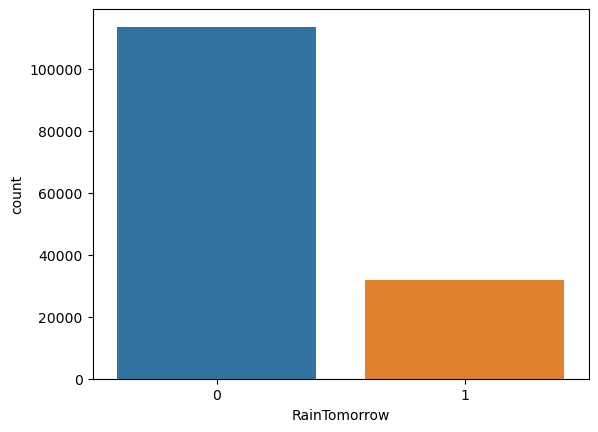

In [12]:
#Intercanviem els valors categòrics 'No' i 'Yes' pels valors numèrics '0' i '1' respectivament
df['RainToday'].replace({'No': 0, 'Yes': 1},inplace = True)
df['RainTomorrow'].replace({'No': 0, 'Yes': 1},inplace = True)

sns.countplot(x= df["RainTomorrow"])

### 3.4 Matriu de correlació

Visualització de la matriu de correlació, la qual ens mostra la relació que existeix entre dos atributs numèrics del dataset.

<AxesSubplot:>

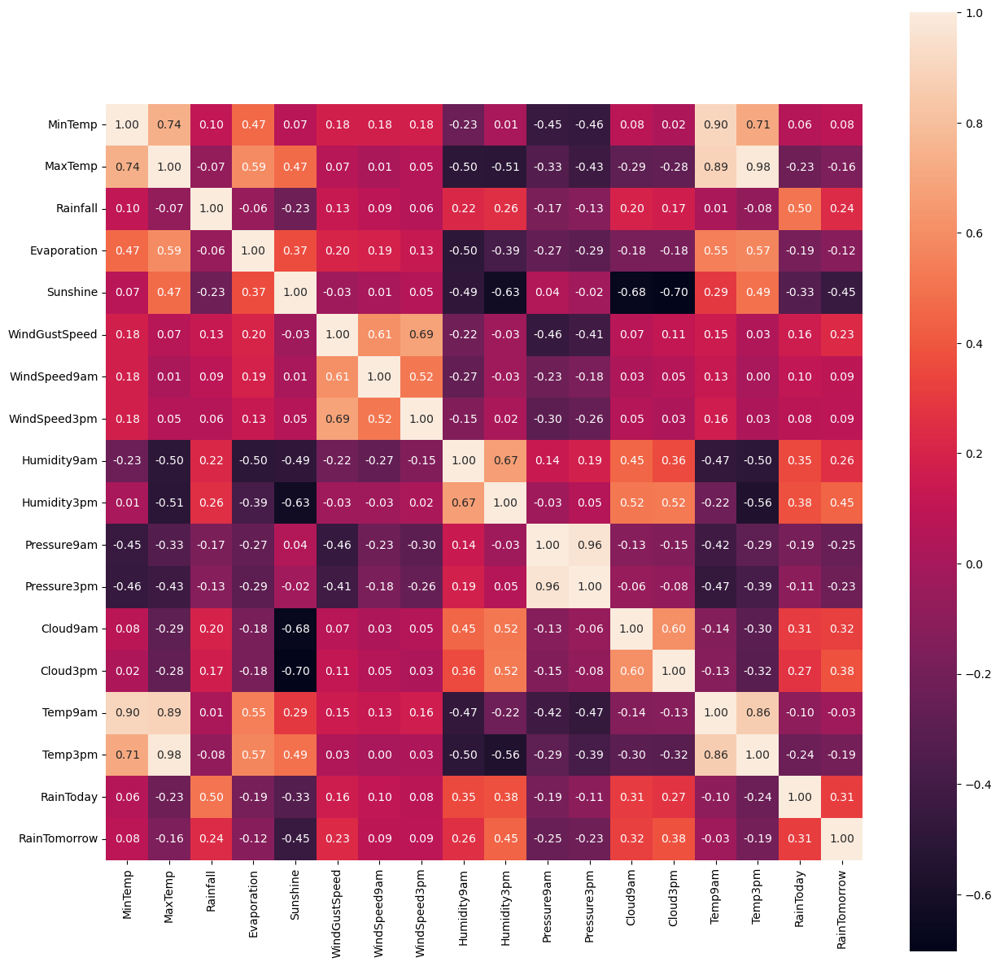

In [7]:
corrmat = df.corr()
plt.subplots(figsize=(15,15))
sns.heatmap(corrmat,annot=True, square=True, fmt='.2f')

### 3.5 Pair Plot 
Visualització de les relacions en format 'scatter' que existeixen entre dos atributs numèrics qualsevols del dataset.

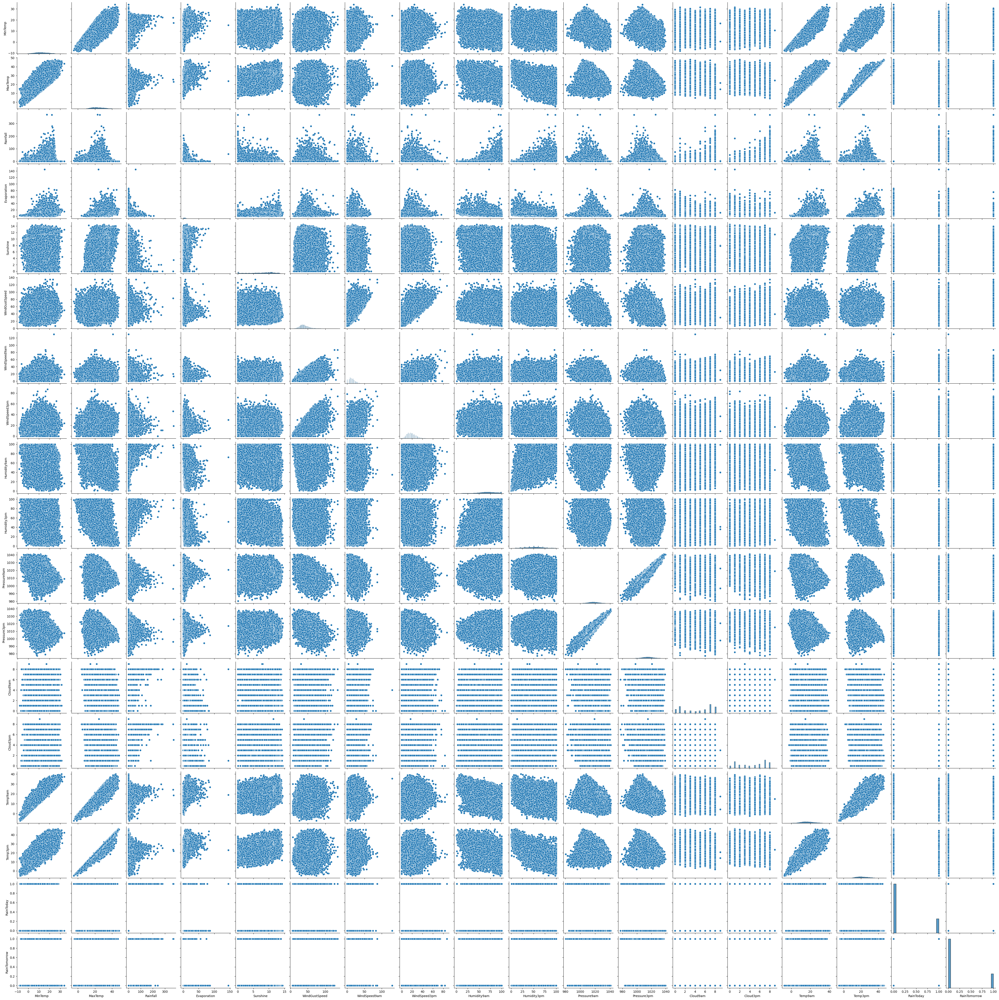

In [6]:
sns.pairplot(df, kind='scatter', diag_kind='hist', palette='Rainbow')
plt.show()

### 3.6 Histogrames

Text(0.5, 1.0, 'Histograms of Columns')

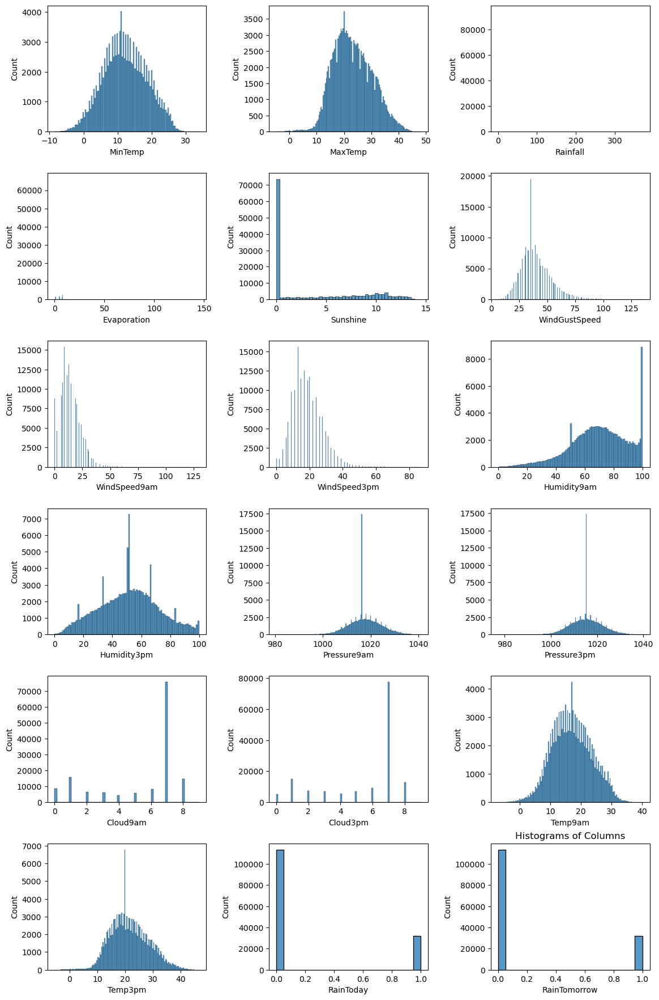

In [17]:
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(12, 18))
axes = axes.reshape(-1)

for i, col in enumerate(numeric):
    sns.histplot(df[col], ax=axes[i])

fig.tight_layout(pad=2.0)
plt.title('Histograms of Columns')

**Observacions:**

- La majoria de les funcions es distribueixen normalment com s'esperava.
- La distribució de 'Rainfall' necessita més investigació, ja que és probable que existeixin outliers que afectin a la capacitat de representar les dades.
- La distribució de 'Sunshine' és deu a:
  - L'alta freqüència de valors 0 representa els dies en què està ennuvolat tot el dia.
  - La disminució brusca de la freqüència després d'unes 11 hores és un reflex del nombre limitat de dies de l'any en què s'apaga la llum durant tantes hores o més.
- La distribució 'Humidity9am' és especialment interessant a causa del gran augment de freqüències prop del 100%
- Com que la secció d'estadístiques de resum va mostrar que el percentil 75 per a la característica de pluja és només 0.8, el gràfic següent mostra la distribució dels valors entre 0 i 1.

### 3.7 Visualització de dades

Visualització gràfica d'algunes relacions d'atributs de la base de dades.

In [13]:
# Convertim el format de l'atribut 'Date' a datetime per poder fer visualitzacions correctament.
df['Date'] = pd.to_datetime(df['Date'])

#### 3.7.1 Relació entre la pluja i el pas dels anys

Text(0.5, 0, 'Years')

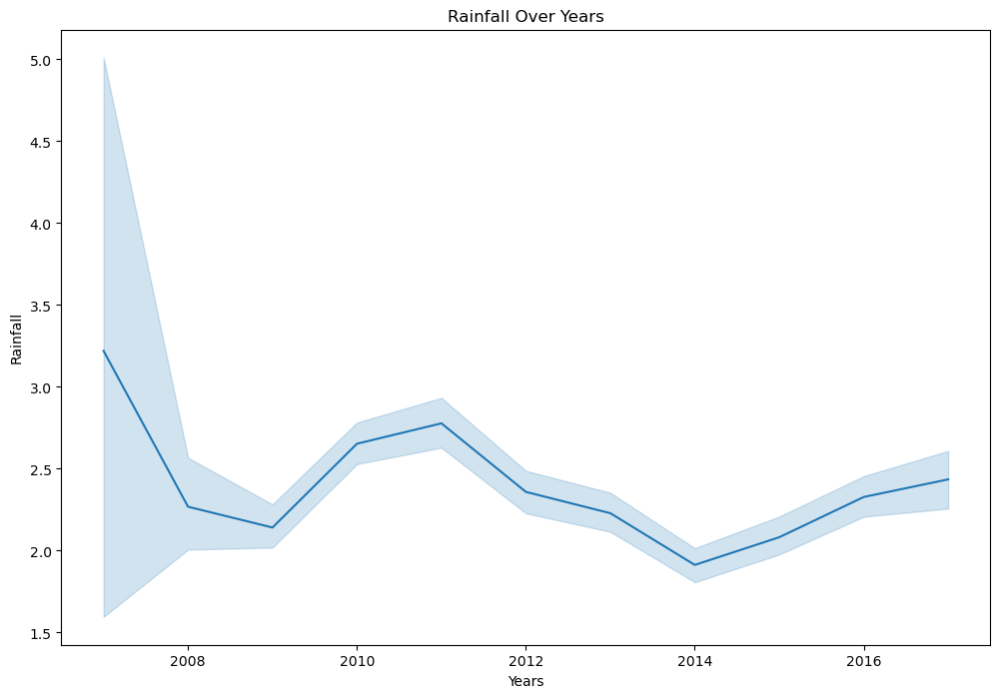

In [14]:
plt.figure(figsize=(12,8))
Time_series=sns.lineplot(x=df['Date'].dt.year,y="Rainfall",data=df)
Time_series.set_title("Rainfall Over Years")
Time_series.set_ylabel("Rainfall")
Time_series.set_xlabel("Years")

#### 3.7.2 Relació entre la velocitat del vent i el pas dels anys

Text(0.5, 0, 'Year')

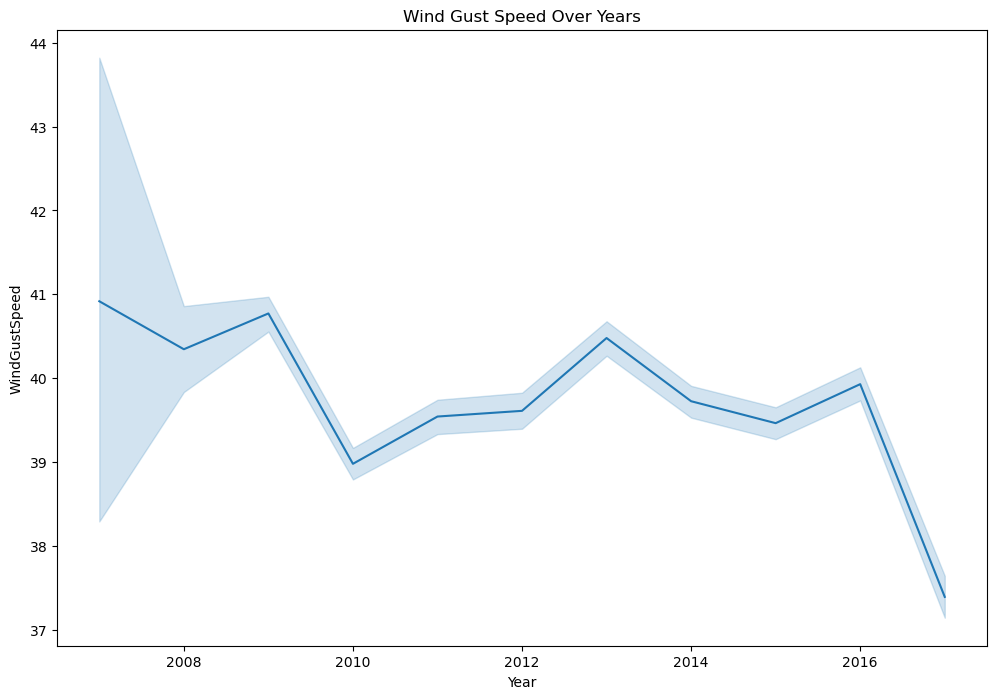

In [15]:
plt.figure(figsize=(12,8))
Days_of_week=sns.lineplot(x=df['Date'].dt.year,y="WindGustSpeed",data=df)
Days_of_week.set_title("Wind Gust Speed Over Years")
Days_of_week.set_ylabel("WindGustSpeed")
Days_of_week.set_xlabel("Year")

#### 3.7.3 Relació entre la temperatura mínima i el pas dels anys

Text(0.5, 0, 'Year')

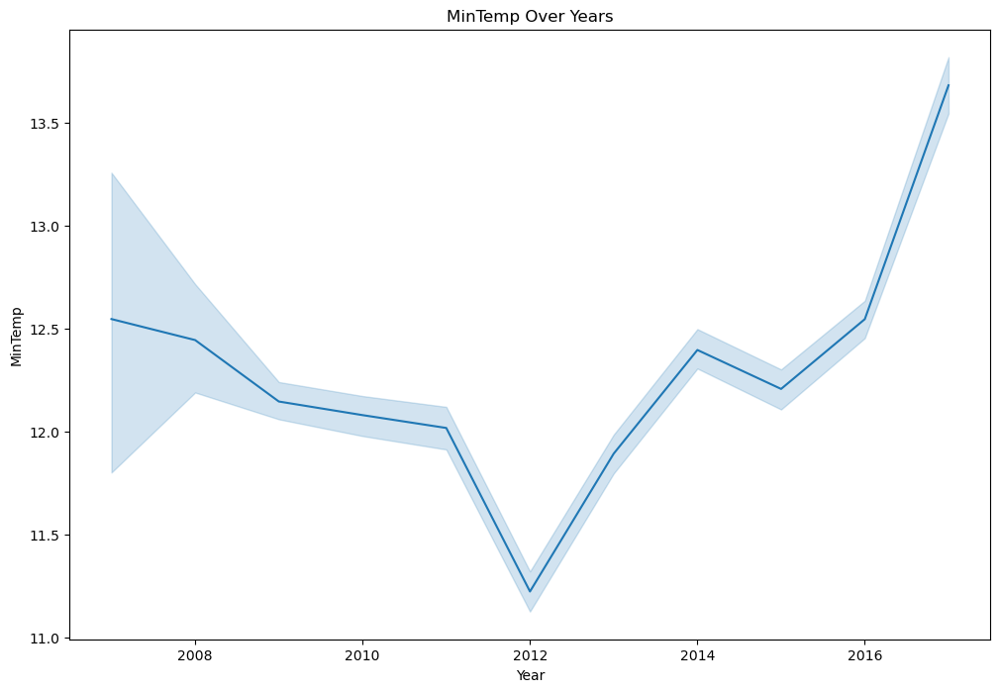

In [50]:
plt.figure(figsize=(12,8))
Days_of_week=sns.lineplot(x=df['Date'].dt.year,y="MinTemp",data=df)
Days_of_week.set_title("MinTemp Over Years")
Days_of_week.set_ylabel("MinTemp")
Days_of_week.set_xlabel("Year")

#### 3.7.4 Relació entre la exposició solar i el pas dels anys

Text(0.5, 0, 'Year')

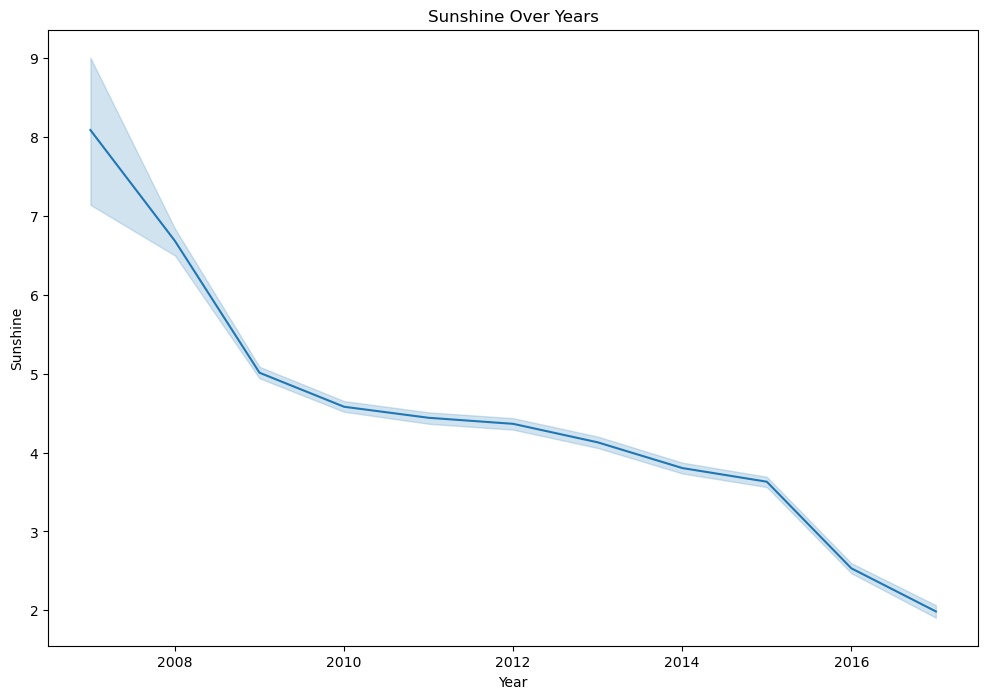

In [51]:
plt.figure(figsize=(12,8))
Days_of_week=sns.lineplot(x=df['Date'].dt.year,y="Sunshine",data=df)
Days_of_week.set_title("Sunshine Over Years")
Days_of_week.set_ylabel("Sunshine")
Days_of_week.set_xlabel("Year")

<a id="4"></a>
 <h2 style='background:#C2C4E2; border:0; color:black'><center>4. PREPROCESSAMENT DE DADES</center></h2> 
 
**Contingut d'aquesta secció:**
* Rebalanceig de classes de l'atribut 'RainTomorrow'
* Codificació atributs categòrics
* Tractament d'Outliers
* Aplicació Scaling

### 4.1 Rebalanceig de la base de dades

Com que tenim moltes més instàncies amb el valor de l'atribut objectiu com 'No', cal balancejar la base de dades. L'objectiu és evitar que el nostre model tingui una inclinació més gran en predir una classe que en l'altra.

In [16]:
# Guardem en variables diferentes les files amb valors corresponents a 'RainTomorrow' => 0 i 1 respectivament.
no = df[df.RainTomorrow == 0]
yes = df[df.RainTomorrow == 1]

#Balancejem la base de dades
yes_oversampled = resample(yes, replace=True, n_samples=len(no), random_state=42)
df = pd.concat([no, yes_oversampled])

Mostrem per pantalla com quedaría el balanceig de la base de dades després del tractament aplicat. Ara tenim les dues classes representades de manera igualitaria, ja que tenim el mateix nombre d'instàncies de cada classe.

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

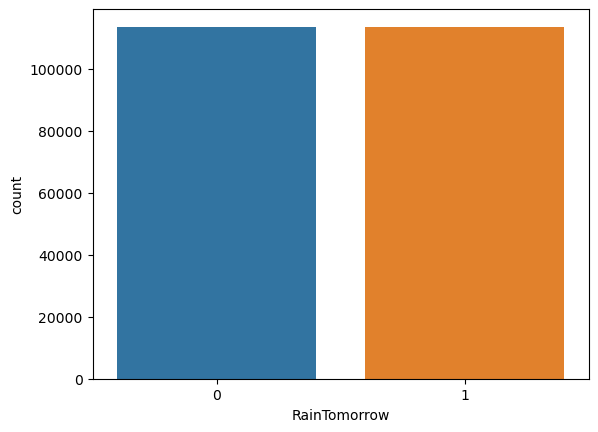

In [17]:
sns.countplot(x= df["RainTomorrow"])

### 4.2 Codificació atributs categòrics

Cal que codifiquem els atributs categòrics per obtenir atributs de tipus numèric, ja que els models de predicció no treballen amb valors categòrics.

In [18]:
label_encoder = LabelEncoder()
for col in categorical:
    df[col] = label_encoder.fit_transform(df[col])
    
df[categorical].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 227166 entries, 0 to 76577
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype
---  ------        --------------   -----
 0   Date          227166 non-null  int64
 1   Location      227166 non-null  int32
 2   WindGustDir   227166 non-null  int32
 3   WindDir9am    227166 non-null  int32
 4   WindDir3pm    227166 non-null  int32
 5   RainToday     227166 non-null  int64
 6   RainTomorrow  227166 non-null  int64
dtypes: int32(4), int64(3)
memory usage: 10.4 MB


### 4.3 Tractament Outliers

Fent ús de la funció IterativeImputer, cal que tractem els outliers que tenim al dataset. 

In [19]:
MiceImputed = df.copy(deep=True) 
mice_imputer = IterativeImputer()
MiceImputed.iloc[:, :] = mice_imputer.fit_transform(df)

# Detecting outliers with IQR
Q1 = MiceImputed.quantile(0.25)
Q3 = MiceImputed.quantile(0.75)
IQR = Q3 - Q1

MiceImputed.shape

(227166, 23)

Ara observem com queden els atributs després de l'eliminació dels outliers. Hem passat de tenir 227.166 instàncies a 96.968.

In [55]:
MiceImputed = MiceImputed[~((MiceImputed < (Q1 - 1.5 * IQR)) | (MiceImputed > (Q3 + 1.5 * IQR))).any(axis=1)]
MiceImputed.shape

(96968, 23)

### 4.4 Aplicar Scaling als atributs

Apliquem un scaling als atributs de la base de dades perquè estiguin agrupats en una escala propera de rangs.

In [21]:
s_scaler = MinMaxScaler()
s_scaler.fit_transform(MiceImputed)
df = pd.DataFrame(s_scaler.transform(MiceImputed), index=MiceImputed.index, columns=MiceImputed.columns)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.115284,0.041667,0.538244,0.513580,0.109091,0.354839,0.000000,0.866667,0.538462,0.866667,...,0.632911,0.212121,0.238938,0.293605,0.857143,0.833333,0.504132,0.532982,0.0,0.0
1,0.115575,0.041667,0.368272,0.567901,0.000000,0.354839,0.000000,0.933333,0.538462,0.400000,...,0.291139,0.242424,0.324484,0.313953,0.714286,0.833333,0.512397,0.598945,0.0,0.0
2,0.115866,0.041667,0.524079,0.582716,0.000000,0.354839,0.000000,1.000000,0.569231,0.866667,...,0.215190,0.292929,0.235988,0.340116,0.714286,0.000000,0.617080,0.569921,0.0,0.0
3,0.116157,0.041667,0.419263,0.639506,0.000000,0.354839,0.000000,0.266667,0.230769,0.600000,...,0.303797,0.151515,0.530973,0.459302,0.714286,0.833333,0.537190,0.656992,0.0,0.0
4,0.116448,0.041667,0.654391,0.745679,0.181818,0.354839,0.000000,0.866667,0.492308,0.066667,...,0.772152,0.323232,0.330383,0.261628,0.714286,1.000000,0.528926,0.741425,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21377,0.199418,0.562500,0.586402,0.422222,0.218182,0.419355,0.198582,0.600000,0.461538,0.600000,...,0.860759,0.717172,0.625369,0.633721,0.714286,0.833333,0.498623,0.437995,1.0,1.0
4037,0.414556,0.083333,0.660057,0.424691,0.145455,0.354839,0.000000,0.533333,0.369231,0.133333,...,1.000000,1.000000,0.330383,0.505814,0.714286,0.833333,0.531680,0.372032,0.0,1.0
92690,0.828530,0.291667,0.767705,0.582716,0.109091,0.354839,0.000000,0.666667,0.461538,1.000000,...,0.822785,0.858586,0.398230,0.293605,0.714286,0.833333,0.658402,0.625330,0.0,1.0
9996,0.397380,0.229167,0.498584,0.377778,0.036364,0.161290,0.049645,0.066667,0.323077,0.266667,...,0.784810,0.959596,0.678466,0.616279,0.857143,1.000000,0.509642,0.369393,0.0,1.0


<a id="5"></a>
 <h2 style='background:#C2C4E2; border:0; color:black'><center>5. SELECCIÓ DE MODELS</center></h2> 
 
**Contingut d'aquesta secció:**

* Declaració de funcions
* Divisió conjunt d'entrenament i test
* Aplicació model Logistic Regression
* Aplicació model Decision Tree
* Aplicació model RandomForest
* Aplicació model Light GBM
* Aplicació model XGBoost
* Aplicació model Xarxa Neuronal

### 5.1 Declaració de funcions

En primer lloc, creem una funció per visualitzar la matriu de confusió de la nostra xarxa neuronal.

In [22]:
def plot_confusion_mat_nn(y_pred, y_test):
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

En segon lloc, creem una funció per visualitzar la corba ROC.

In [23]:
def plot_roc_cur(fper, tper):  
    plt.plot(fper, tper, color = 'orange', label = 'ROC')
    plt.plot([0, 1], [0, 1], color = 'darkblue', linestyle = '--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

En tercer lloc, creem una funció que ens permeti entrenar al nostre model i obtenir uns certs paràmetres per avaluar-los.

In [45]:
import time
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, plot_confusion_matrix, roc_curve, classification_report
def run_model(model, X_train, y_train, X_test, y_test, verbose=True, nn=False):
    t0=time.time()
    if nn==False:
        if verbose == False:
            model.fit(X_train,y_train, verbose=0)
        else:
            model.fit(X_train,y_train)
            y_pred = model.predict(X_test)
            probs = model.predict_proba(X_test)
            probs = probs[:, 1]  


    else:
        model_nn.fit(X_train, y_train, epochs = 20, batch_size = 100, validation_data = (X_test, y_test), verbose = 1)
        y_pred = []
        probs = model_nn.predict(X_test)
        for y in probs:
            if y >= 0.5:
                y_pred.append(1.0)
            else:
                y_pred.append(0.0)
            
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred) 
    coh_kap = cohen_kappa_score(y_test, y_pred)
    time_taken = time.time()-t0
    print("Accuracy = {0:.3f}".format(accuracy))
    print("ROC Area under Curve = {0:.3f}".format(roc_auc))
    print("Cohen's Kappa = {0:.3f}".format(coh_kap))
    print("Time taken = {0:.3f}".format(time_taken))
    print(classification_report(y_test,y_pred,digits=5))
    
    fper, tper, thresholds = roc_curve(y_test, probs) 
    plot_roc_cur(fper, tper)
    
    if nn==True:
        plot_confusion_mat_nn(y_pred, list(y_test))
    else:
        plot_confusion_matrix(model, X_test, y_test, cmap = plt.cm.Blues, normalize = 'all')
    
    return model, accuracy, roc_auc, coh_kap, time_taken

### 5.2 Divisió conjunt d'entrenament i test

In [32]:
X = df.loc[:,df.columns!='RainTomorrow']
y = df[['RainTomorrow']]

features = MiceImputed[X.columns]
target = MiceImputed['RainTomorrow']
features.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday'],
      dtype='object')

In [33]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 42)

features.shape

(96968, 22)

### 5.3 Logistic Regression

Millor paràmeters:  {'solver': 'newton-cg', 'penalty': 'l2', 'C': 1000.0}
Accuracy = 0.745
ROC Area under Curve = 0.742
Cohen's Kappa = 0.486
Time taken = 4.334
              precision    recall  f1-score   support

         0.0    0.74657   0.78987   0.76761     10327
         1.0    0.74374   0.69461   0.71833      9067

    accuracy                        0.74533     19394
   macro avg    0.74515   0.74224   0.74297     19394
weighted avg    0.74525   0.74533   0.74457     19394



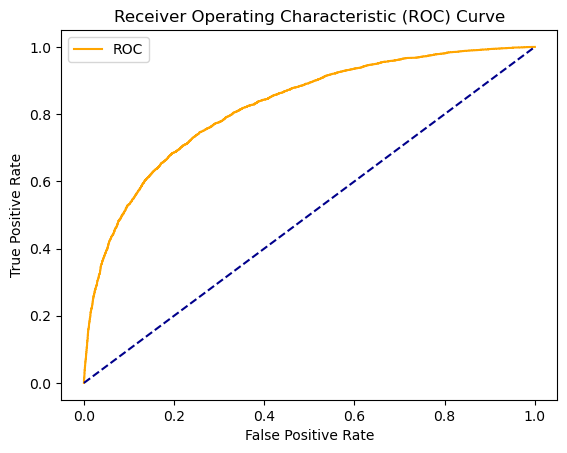

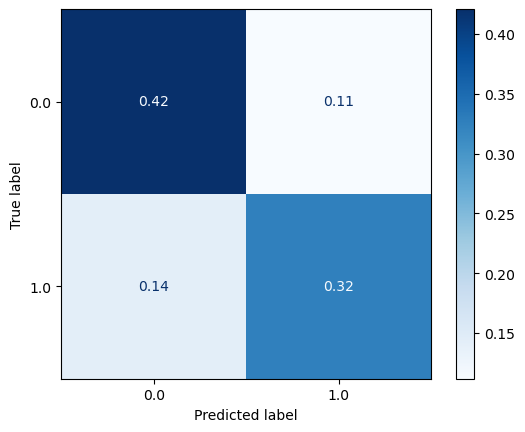

In [34]:
params_lr = {
    'penalty' : ['l1','l2'], 
    'C'       : np.logspace(-3,3,7),
    'solver'  : ['newton-cg', 'lbfgs', 'liblinear'],
}

model_lr = LogisticRegression()
randomized_search = RandomizedSearchCV(model_lr, params_lr, cv = 5, n_iter = 10, n_jobs = -1)
randomized_search.fit(X_train, y_train)

print("Millor paràmeters: ", randomized_search.best_params_)

model_lr = LogisticRegression(**randomized_search.best_params_)
model_lr, accuracy_lr, roc_auc_lr, coh_kap_lr, tt_lr = run_model(model_lr, X_train, y_train, X_test, y_test)

### 5.4 Decision Tree

Millor paràmeters:  {'max_features': 'log2', 'max_depth': 15, 'criterion': 'entropy', 'ccp_alpha': 0.001}
Accuracy = 0.699
ROC Area under Curve = 0.694
Cohen's Kappa = 0.391
Time taken = 0.204
              precision    recall  f1-score   support

         0.0    0.69726   0.76808   0.73096     10327
         1.0    0.70130   0.62016   0.65824      9067

    accuracy                        0.69893     19394
   macro avg    0.69928   0.69412   0.69460     19394
weighted avg    0.69915   0.69893   0.69696     19394



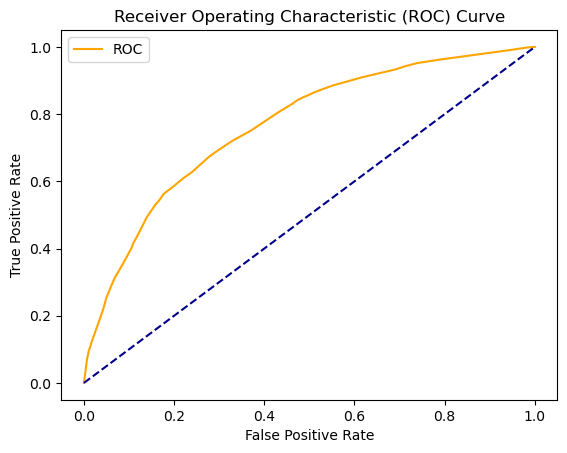

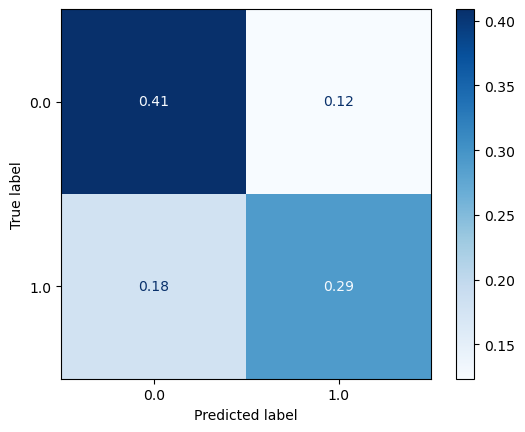

In [35]:
params_dt = {
    'max_features': ['auto', 'sqrt', 'log2'],
    'ccp_alpha'   : [0.1, .01, .001],
    'max_depth'   : [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16],
    'criterion'   : ['gini', 'entropy']
}

model_dt = DecisionTreeClassifier(random_state = 1024)
randomized_search = RandomizedSearchCV(model_dt, params_dt, cv = 5, n_iter = 10, n_jobs = -1)
randomized_search.fit(X_train, y_train)

print("Millor paràmeters: ", randomized_search.best_params_)
model_dt = DecisionTreeClassifier(**randomized_search.best_params_)
model_dt, accuracy_dt, roc_auc_dt, coh_kap_dt, tt_dt = run_model(model_dt, X_train, y_train, X_test, y_test)

### 5.5 RandomForest

Millor paràmeters:  {'n_estimators': 800, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 30}
Accuracy = 0.935
ROC Area under Curve = 0.936
Cohen's Kappa = 0.870
Time taken = 97.492
              precision    recall  f1-score   support

         0.0    0.95567   0.92060   0.93781     10327
         1.0    0.91319   0.95136   0.93189      9067

    accuracy                        0.93498     19394
   macro avg    0.93443   0.93598   0.93485     19394
weighted avg    0.93581   0.93498   0.93504     19394



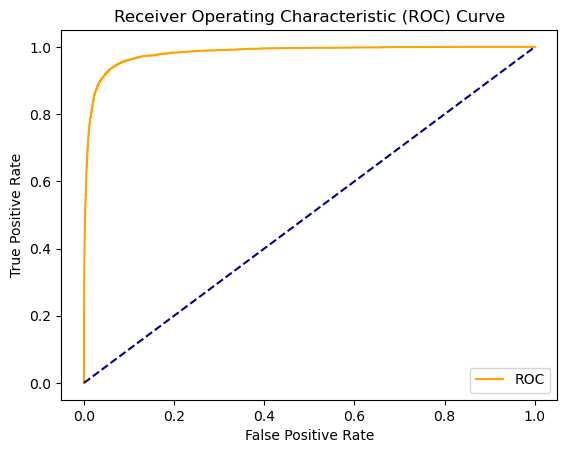

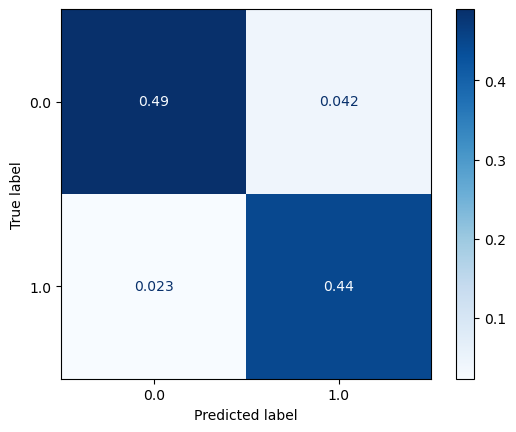

In [36]:
params_rf = {
    'max_depth': [10, 30, 60, 100],
    'max_features': ['auto', 'sqrt'],
    'min_samples_leaf': [1, 2, 4],
    'min_samples_split': [2, 5, 10],
    'n_estimators': [200, 400, 800]
}

model_rf = RandomForestClassifier()
randomized_search = RandomizedSearchCV(model_rf, params_rf, cv = 5, n_iter = 5, n_jobs=-1)
randomized_search.fit(X_train, y_train)

print("Millor paràmeters: ", randomized_search.best_params_)
model_rf = RandomForestClassifier(**randomized_search.best_params_)
model_rf, accuracy_rf, roc_auc_rf, coh_kap_rf, tt_rf = run_model(model_rf, X_train, y_train, X_test, y_test)

### 5.6 Light GBM

Millor paràmeters:  {'reg_alpha': 0.01, 'num_leaves': 80, 'min_child_samples': 5, 'max_depth': 20, 'learning_rate': 0.2}
Accuracy = 0.864
ROC Area under Curve = 0.865
Cohen's Kappa = 0.728
Time taken = 1.129
              precision    recall  f1-score   support

         0.0    0.88854   0.85146   0.86960     10327
         1.0    0.83849   0.87835   0.85796      9067

    accuracy                        0.86403     19394
   macro avg    0.86352   0.86490   0.86378     19394
weighted avg    0.86514   0.86403   0.86416     19394



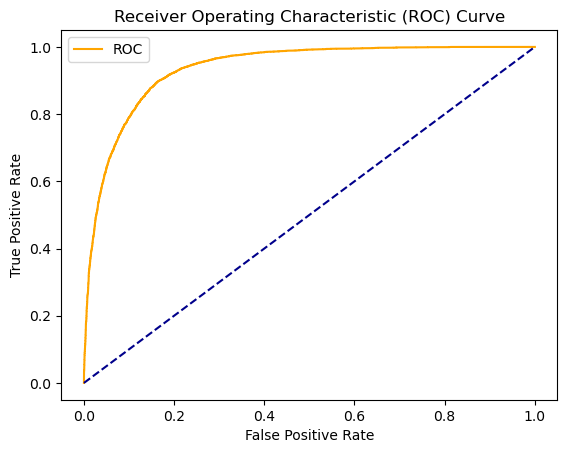

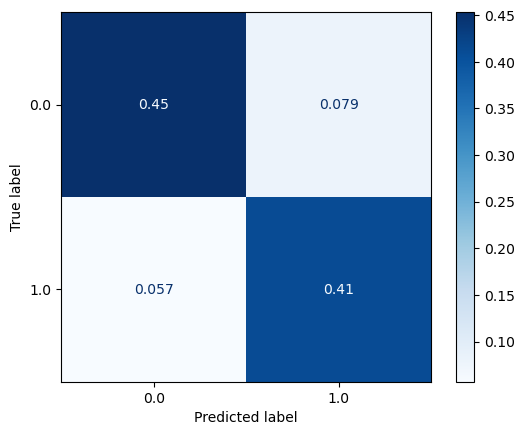

In [37]:
params_lgb = {
    'num_leaves'       : [20, 40, 60, 80, 100], 
    'min_child_samples': [5, 10, 15],
    'max_depth'        : [-1, 5, 10, 20],
    'learning_rate'    : [0.05, 0.1, 0.2],
    'reg_alpha'        : [0, 0.01, 0.03]
}

model_lgb = lgb.LGBMClassifier()
randomized_search = RandomizedSearchCV(model_lgb, params_lgb, cv = 5, n_iter = 10, n_jobs = -1)
randomized_search.fit(X_train, y_train)

print("Millor paràmeters: ", randomized_search.best_params_)
model_lgb = lgb.LGBMClassifier(**randomized_search.best_params_)
model_lgb, accuracy_lgb, roc_auc_lgb, coh_kap_lgb, tt_lgb = run_model(model_lgb, X_train, y_train, X_test, y_test)

### 5.7 XGBoost

Millor paràmeters:  {'n_estimators': 800, 'min_child_weight': 1, 'max_depth': 5, 'learning_rate': 1, 'gamma': 0.2}
Accuracy = 0.931
ROC Area under Curve = 0.933
Cohen's Kappa = 0.862
Time taken = 20.780
              precision    recall  f1-score   support

         0.0    0.97335   0.89465   0.93234     10327
         1.0    0.89012   0.97210   0.92931      9067

    accuracy                        0.93085     19394
   macro avg    0.93173   0.93337   0.93082     19394
weighted avg    0.93444   0.93085   0.93092     19394



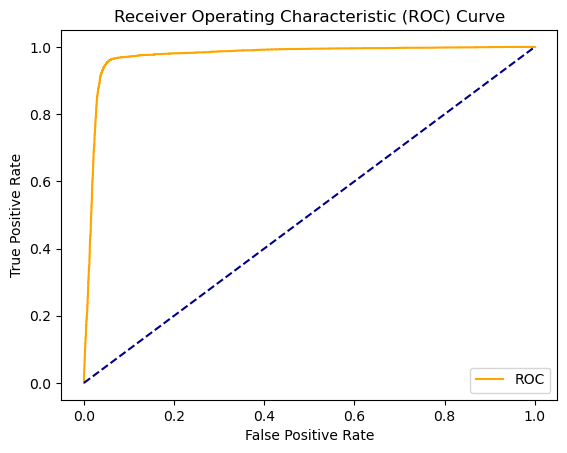

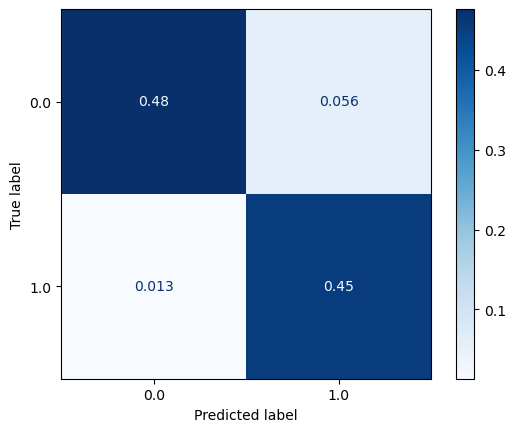

In [38]:
params_xgb = {
    "learning_rate"    : [0.01, 0.1, 1],
    'max_depth'        : [-1, 5, 10],
    "min_child_weight" : [1, 5, 7],
    "gamma"            : [0.1, 0.2, 0.3],
    "n_estimators"     : [200, 400, 800, 1200]
}


model_xgb = xgb.XGBClassifier()
randomized_search = RandomizedSearchCV(model_xgb, params_xgb, cv = 5, n_iter = 5, n_jobs = -1)
randomized_search.fit(X_train, y_train)

print("Millor paràmeters: ",randomized_search.best_params_)
model_xgb = xgb.XGBClassifier(**randomized_search.best_params_)
model_xgb, accuracy_xgb, roc_auc_xgb, coh_kap_xgb, tt_xgb = run_model(model_xgb, X_train, y_train, X_test, y_test)

### 5.7 Neural Network

Epoch 1/20
776/776 [==============================] - 5s 6ms/step - loss: 5.1844 - binary_accuracy: 0.6072 - val_loss: 0.6639 - val_binary_accuracy: 0.6999
Epoch 2/20
776/776 [==============================] - 4s 6ms/step - loss: 0.8324 - binary_accuracy: 0.6632 - val_loss: 0.7004 - val_binary_accuracy: 0.6837
Epoch 3/20
776/776 [==============================] - 4s 6ms/step - loss: 0.6729 - binary_accuracy: 0.6797 - val_loss: 0.6352 - val_binary_accuracy: 0.6882
Epoch 4/20
776/776 [==============================] - 4s 6ms/step - loss: 0.5968 - binary_accuracy: 0.6987 - val_loss: 0.5374 - val_binary_accuracy: 0.7312
Epoch 5/20
776/776 [==============================] - 5s 6ms/step - loss: 0.5852 - binary_accuracy: 0.7022 - val_loss: 0.5565 - val_binary_accuracy: 0.7227
Epoch 6/20
776/776 [==============================] - 5s 6ms/step - loss: 0.5624 - binary_accuracy: 0.7137 - val_loss: 0.5328 - val_binary_accuracy: 0.7334
Epoch 7/20
776/776 [==============================] - 5s 6ms/ste

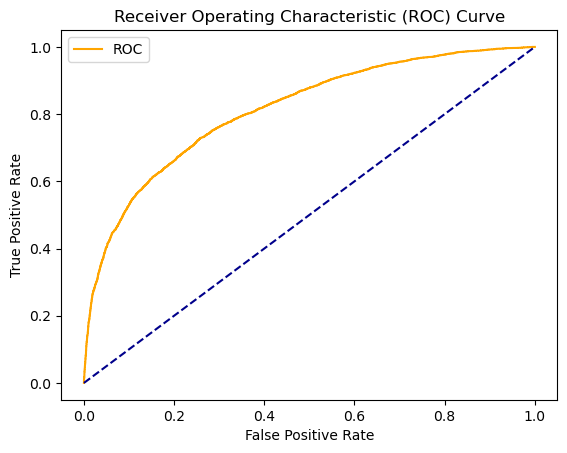

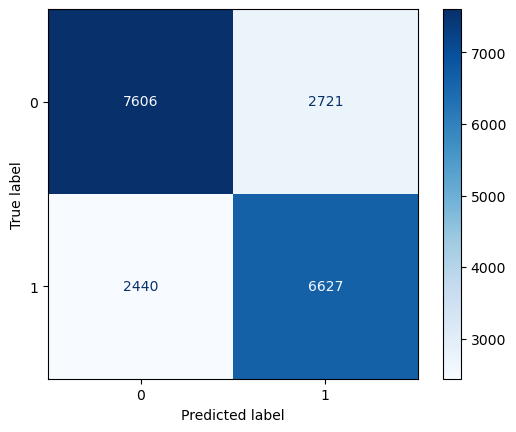

In [46]:
# create model
model_nn = Sequential()
model_nn.add(Dense(1024, input_dim = 22, activation = 'relu'))
model_nn.add(Dense(712, activation = 'relu'))
model_nn.add(Dense(1, activation = 'sigmoid'))

early_stopping = keras.callbacks.EarlyStopping(patience = 12, min_delta = 0.001, restore_best_weights = True)
# Compile model
model_nn.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['binary_accuracy'])
# evaluate the model
model_nn, accuracy_nn, roc_auc_nn, coh_kap_nn, tt_nn = run_model(model_nn, X_train, y_train, X_test, y_test, nn=True)

<a id="6"></a>
 <h2 style='background:#C2C4E2; border:0; color:black'><center>6. CONCLUSIONS</center></h2> 
 
**En aquesta secció es parla sobre:**

* Comparativa de models respecte les Accuracies
* Comparativa de models respecte les ROC AUC score
* Comparativa de models respecte els Temps d'execució
* Comparativa de models respecte els Cohen kappa scores
* Comentaris

In [47]:
accuracy_scores = [accuracy_lr, accuracy_dt, accuracy_rf, accuracy_lgb, accuracy_xgb, accuracy_nn]
roc_auc_scores = [roc_auc_lr, roc_auc_dt, roc_auc_rf, roc_auc_lgb, roc_auc_xgb, roc_auc_nn]
coh_kap_scores = [coh_kap_lr, coh_kap_dt, coh_kap_rf, coh_kap_lgb, coh_kap_xgb, coh_kap_nn]
tt = [tt_lr, tt_dt, tt_rf, tt_lgb, tt_xgb, tt_nn]

### 6.1 Comparació d'Accuracies

L'Accuracy score ens indica el percentatge de prediccions correctes respecte al nombre total de prediccions.

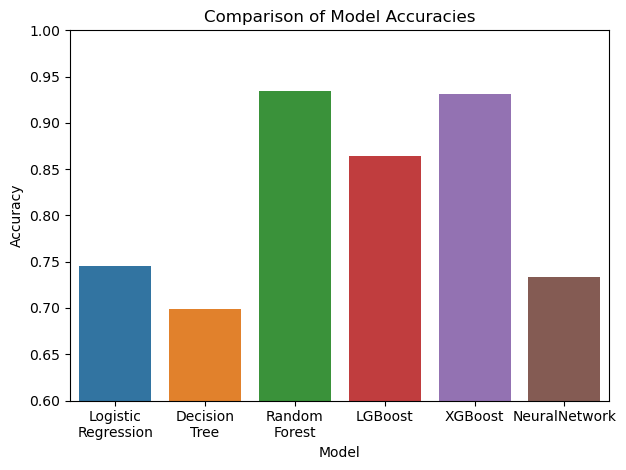

In [49]:
sns.barplot(x=['Logistic\nRegression', 'Decision\nTree', 'Random\nForest', 'LGBoost', 'XGBoost', 'NeuralNetwork'],
            y=accuracy_scores)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0.6, 1.0)
plt.title('Comparison of Model Accuracies')
plt.tight_layout()

### 6.2 Comparació de ROC AUC scores

El ROC AUC score ens indica fins a quin punt el model és capaç de distingir entre classes. Com més alt sigui l'AUC, millor serà el model per predir 0 classes com a 0 i 1 classes com 1.

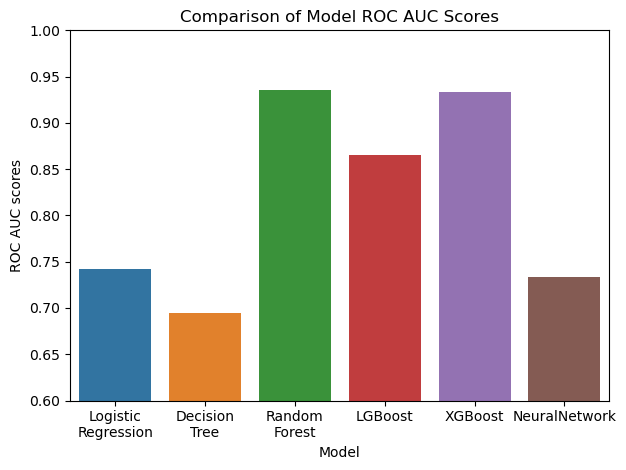

In [50]:
sns.barplot(x=['Logistic\nRegression', 'Decision\nTree', 'Random\nForest', 'LGBoost', 'XGBoost', 'NeuralNetwork'],
            y=roc_auc_scores)
plt.xlabel('Model')
plt.ylabel('ROC AUC scores')
plt.ylim(0.6, 1.0)
plt.title('Comparison of Model ROC AUC Scores')
plt.tight_layout()

### 6.3 Comparació de temps d'execució

El temps d'execució ens mostra la quantitat de temps que triguen els models en donar resultats.

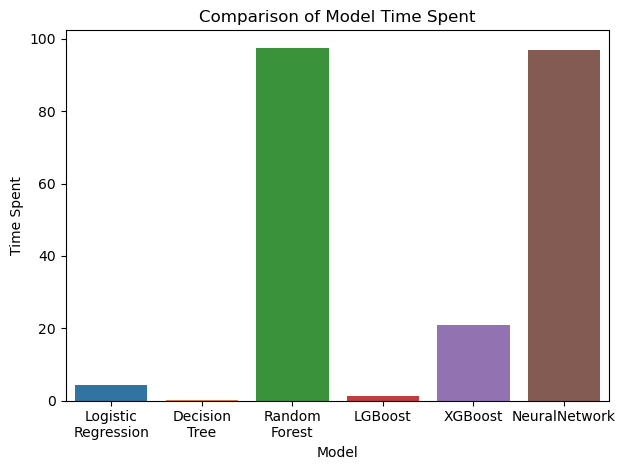

In [51]:
sns.barplot(x=['Logistic\nRegression', 'Decision\nTree', 'Random\nForest', 'LGBoost', 'XGBoost', 'NeuralNetwork'],
            y=tt)
plt.xlabel('Model')
plt.ylabel('Time Spent')
plt.title('Comparison of Model Time Spent')
plt.tight_layout()

### 6.4 Comparativa Cohen Kappa scores

El Cohen Kappa score ens indica la fiabilitat per a dos avaluadors que puntuen el mateix, corregit per la freqüència amb què els avaluadors poden estar d'acord per casualitat.

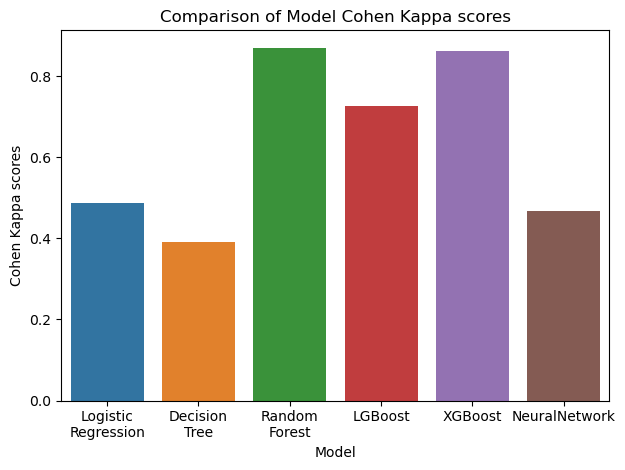

In [52]:
sns.barplot(x=['Logistic\nRegression', 'Decision\nTree', 'Random\nForest', 'LGBoost', 'XGBoost', 'NeuralNetwork'],
            y=coh_kap_scores)
plt.xlabel('Model')
plt.ylabel('Cohen Kappa scores')
plt.title('Comparison of Model Cohen Kappa scores')
plt.tight_layout()

### 6.5 Comentaris finals

Després de poder visualitzar els resultats obtinguts pels diferents models, podem seleccionar entre els models Random Forest i XGBoost, com a millors models de predicció per aquest conjunt de dades, ja que són els que més Accuracy ens aporten, arribant a un 93,5% de precisió. 

Si fem la comparació en relació als temps d'execució, el millor model seria XGBoost, ja que ens aporta un accuracy molt proper al de Random Forest, però trigant un 80% menys de temps.

Finalment, en relació al coeficient Kappa, els dos millors models serien Random Forest i XGBoost.

In [54]:
model_data = {'Model': ['Logistic Regression','Decision Tree','Random Forest','LightGBM','XGBoost', 'NeuralNetwork'],
              'Accuracy': accuracy_scores,
              'ROC_AUC': roc_auc_scores,
              'Cohen_Kappa': coh_kap_scores,
              'Time taken': tt}
data = pd.DataFrame(model_data)
print(data)

                 Model  Accuracy   ROC_AUC  Cohen_Kappa  Time taken
0  Logistic Regression  0.745334  0.742239     0.486438    4.333589
1        Decision Tree  0.698928  0.694122     0.391004    0.204100
2        Random Forest  0.934980  0.935979     0.869741   97.492251
3             LightGBM  0.864030  0.864904     0.727697    1.128562
4              XGBoost  0.930855  0.933371     0.861899   20.779694
5        NeuralNetwork  0.733887  0.733704     0.466526   96.881724
